# Lab 1: Independent Component Analysis

### Machine Learning 2 (2020)

* Only a (random) selection of the problems will be graded (unknown to the students in advance). Those points will count as bonus. The average grade obtained will be added as a bonus (up to max 1pt) to the final grade (before rounding).
* The deadline is Friday, September 18th, 17:00.
* Assignment should be submitted through Canvas! Attach the .IPYNB (IPython Notebook) file containing your code and answers. Naming of the file should be "studentid1\_lab#", for example, the attached file should be "12345\_lab1.ipynb". 

Notes on implementation:

* You should write your code and answers in an IPython Notebook: http://ipython.org/notebook.html. If you have problems, please ask.
* Use __one cell__ for code and markdown answers only!
    * Put all code in the cell with the ```# YOUR CODE HERE``` comment and overwrite the ```raise NotImplementedError()``` line.
    * For theoretical questions, put your solution using LaTeX style formatting in the YOUR ANSWER HERE cell.
* Among the first lines of your notebook should be "%pylab inline". This imports all required modules, and your plots will appear inline.
* Large parts of you notebook will be graded automatically. Therefore it is important that your notebook can be run completely without errors and within a reasonable time limit. To test your notebook before submission, select Kernel -> Restart \& Run All.

### Literature
In this assignment, we will implement the Independent Component Analysis algorithm as described in chapter 34 of David MacKay's book "Information Theory, Inference, and Learning Algorithms", which is freely available here:
http://www.inference.phy.cam.ac.uk/mackay/itila/book.html

Read the ICA chapter carefuly before you continue!

### Notation

$\mathbf{X}$ is the $M \times T$ data matrix, containing $M$ measurements at $T$ time steps.

$\mathbf{S}$ is the $S \times T$ source matrix, containing $S$ source signal values at $T$ time steps. We will assume $S = M$.

$\mathbf{A}$ is the mixing matrix. We have $\mathbf{X} = \mathbf{A S}$.

$\mathbf{W}$ is the matrix we aim to learn. It is the inverse of $\mathbf{A}$, up to indeterminacies (scaling and permutation of sources).

$\phi$ is an elementwise non-linearity or activation function, typically applied to elements of $\mathbf{W X}$.

### Code
In the following assignments, you can make use of the signal generators listed below.



In [1]:
%pylab inline
import sys
assert sys.version_info[:3] >= (3, 6, 0), "Make sure you have Python 3.6 installed"

# Signal generators
def sawtooth(x, period=0.2, amp=1.0, phase=0.):
    return (((x / period - phase - 0.5) % 1) - 0.5) * 2 * amp

def sine_wave(x, period=0.2, amp=1.0, phase=0.):
    return np.sin((x / period - phase) * 2 * np.pi) * amp

def square_wave(x, period=0.2, amp=1.0, phase=0.):
    return ((np.floor(2 * x / period - 2 * phase - 1) % 2 == 0).astype(float) - 0.5) * 2 * amp

def triangle_wave(x, period=0.2, amp=1.0, phase=0.):
    return (sawtooth(x, period, 1., phase) * square_wave(x, period, 1., phase) + 0.5) * 2 * amp

def random_nonsingular_matrix(d=2):
    """
    Generates a random nonsingular (invertible) matrix of shape d*d
    """
    epsilon = 0.1
    A = np.random.rand(d, d)
    while abs(np.linalg.det(A)) < epsilon:
        A = np.random.rand(d, d)
    return A

def plot_signals(X, title="Signals"):
    """
    Plot the signals contained in the rows of X.
    """
    figure()
    
    for i in range(X.shape[0]):
        ax = plt.subplot(X.shape[0], 1, i + 1)
        plot(X[i, :])
        ax.set_xticks([])
        ax.set_yticks([])
    plt.suptitle(title)

Populating the interactive namespace from numpy and matplotlib


The following code generates some toy data to work with.

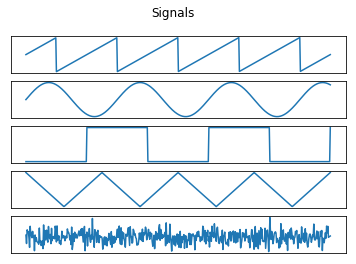

In [2]:
# Generate data
num_sources = 5
signal_length = 500
t = linspace(0, 1, signal_length)
S = np.c_[sawtooth(t), sine_wave(t, 0.3), square_wave(t, 0.4), triangle_wave(t, 0.25), np.random.randn(t.size)].T
plot_signals(S)

### 1.1 Make mixtures (5 points)
Write a function `make_mixtures(S, A)' that takes a matrix of source signals $\mathbf{S}$ and a mixing matrix $\mathbf{A}$, and generates mixed signals $\mathbf{X}$.

In [3]:
### 1.1 Make mixtures
def make_mixtures(S, A):
    "Returns matrix multiplication of inputs."
    return A.dot(S)

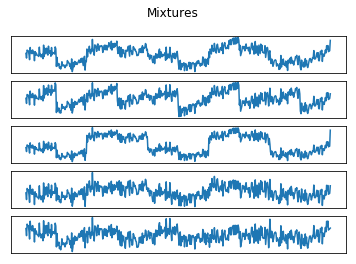

In [4]:
### Test your function
np.random.seed(42)
A = random_nonsingular_matrix(d=S.shape[0])
X = make_mixtures(S, A)
plot_signals(X, "Mixtures")

assert X.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


### 1.2 Histogram (5 points)
Write a function `plot_histograms(X)` that takes a data-matrix $\mathbf{X}$ and plots one histogram for each signal (row) in $\mathbf{X}$. You can use the `np.histogram()` (followed by `plot`) or `plt.hist()` function. 

Plot histograms of the sources and the measurements.

In [5]:
### 1.2 Histogram
def plot_histograms(X, title = "Histograms of each signal (row) in X"):
    """
    Plot histograms corresponding to the signals contained in the rows of X.
    """
    
    for i in range(X.shape[0]):
        plt.figure()
        #ax = plt.subplot(X.shape[0], 1, i + 1)
        plt.hist(X[i, :])
        #ax.set_xticks([])
        #ax.set_yticks([])
    plt.suptitle(title)

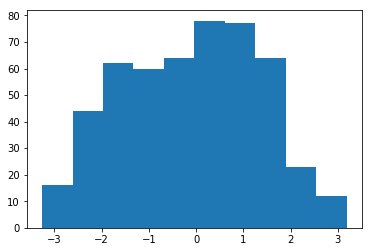

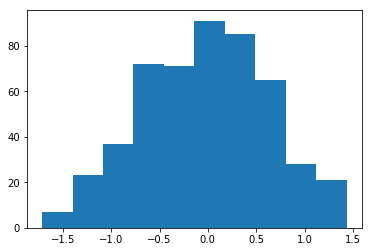

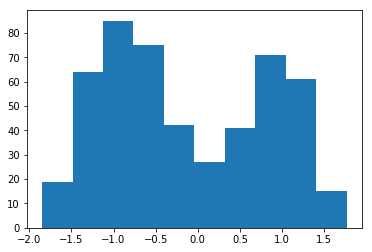

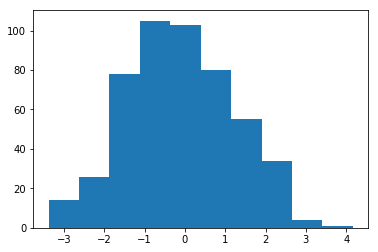

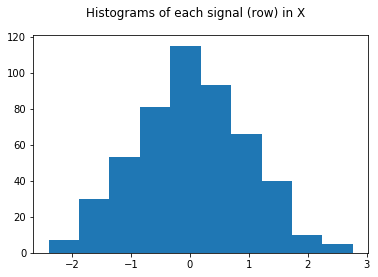

In [6]:
## Testing histogram function
plot_histograms(X)

Which of these distributions (sources or measurements) tend to look more like Gaussians? Can you think of an explanation for this phenomenon? Why is this important for ICA?

Visually, the second and fourth histograms *look* most like Gaussians. They are both unimodal, and the least skewed (although the fourth is a little right-skewed).

Has to do with the sources. Smoothed ones are more likely to look Gaussian than non-smoothed distributions. Noisy ones also tend to look Gaussian.

### 1.3 Implicit priors (20 points)
As explained in MacKay's book, an activation function $\phi$ used in the ICA learning algorithm corresponds to a prior distribution over sources. Specifically, $\phi(a) = \frac{d}{da} \ln p(a)$. For each of the following activation functions, *derive* the source distribution they correspond to.
$$\phi_0(a) = -\tanh(a)$$
$$\phi_1(a) = -a + \tanh(a)$$
$$\phi_2(a) = -a^3$$
$$\phi_3(a) = -\frac{6a}{a^2 + 5}$$

Give your answer without the normalizing constant, so an answer of the form $p(a) \propto \verb+[answer]+$ is ok.

Derivation of the source distribution $p(a)$ is done as follows: 
$\phi(a) = \frac{d}{da}\ln(p(a)) \Leftrightarrow p(a) \propto \exp[\int \phi(a) da]$.

So we have the following distributions:

$p_{0}(a) = \exp[-\int \tanh(a) da] \propto \exp[-\ln(\cosh(a)) da] = \frac{1}{\cosh(a))} = \frac{1}{e^{a} + e^{-a}}$

$p_{1}(a) = \exp[-\int a da + \int \tanh(a) da] \propto \exp[-\frac{1}{2}a^2]\cosh(a)$

$p_{2}(a) = \exp[-\int a^3 da] \propto \exp[-\frac{1}{4}a^4]$

$p_{3}(a) = \exp\big[-\int \frac{6a}{a^2 + 5} da\big] = \exp\big[-3\int \frac{2a}{a^2 + 5} da\big]$. 

Now let $f(a) := a^2 + 5$ and thereby $f'(a) = 2a$, yielding $p_{3}(a) = \exp\big[-3\int \frac{f'(a)}{f(a)} da\big]$, and thus 

$p_{3}(a) \propto \exp\big[-3 \ln(a^2 + 5)\big] = (a^2 + 5)^{-3}$. 

In [7]:
def phi_0(a):
    return -np.tanh(a)

def p_0(a):
    return 1 / np.cosh(a)

In [8]:
def phi_1(a):
    return -a + np.tanh(a)

def p_1(a):
    return np.exp(-0.5 * a**2) * np.cosh(a)

In [9]:
def phi_2(a):
    return -a**3

def p_2(a):
    return -0.25 * a**4

In [10]:
def phi_3(a):
    return -6*a / (a**2 + 5)

def p_3(a):
    return (a**2 + 5)**(-3)

In [11]:
activation_functions = [phi_0, phi_1, phi_2, phi_3]
priors = [p_0, p_1, p_2, p_3]

a = np.linspace(-5, 5, 1000)
for prior in priors:
    assert prior(a).shape == (1000, ), "Wrong output shape"


Plot the activation functions and the corresponding prior distributions, from $a = -5$ to $5$ (hint: use the lists defined in the cell above). Compare the shape of the priors to the histogram you plotted in the last question.

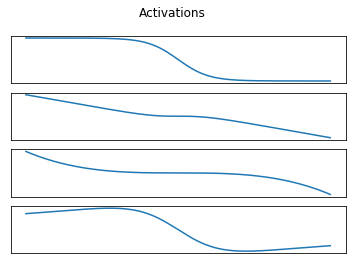

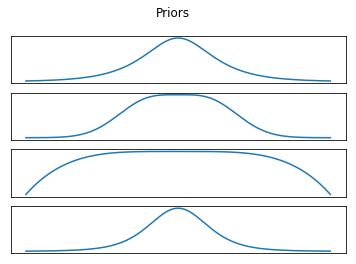

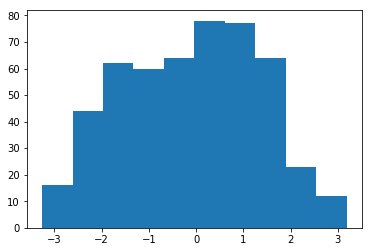

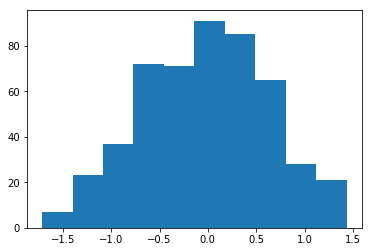

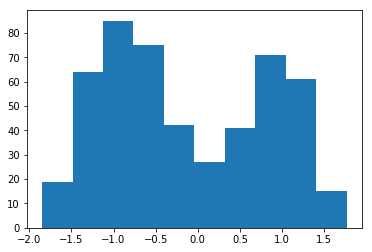

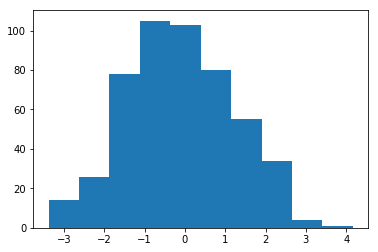

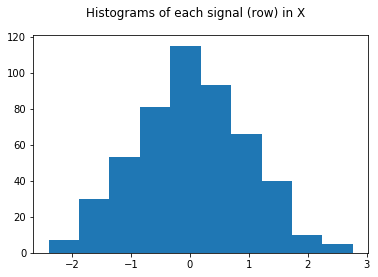

In [12]:
### 1.3 Implicit priors (continued)
a = np.linspace(-5, 5, 1000)
activation_functions = [phi_0, phi_1, phi_2, phi_3]
priors = [p_0, p_1, p_2, p_3]


def plot_functions(functions, a, title = 'Activations'):
    """
    Plot functions for a given range a.
    """
    figure()
    
    subplot_rows = len(functions)
    
    for i in range(subplot_rows):
        ax = plt.subplot(subplot_rows, 1, i+ 1)
        plot(functions[i](a))
        ax.set_xticks([])
        ax.set_yticks([])
    plt.suptitle(title)
    

plot_functions(activation_functions, a)
plot_functions(priors, a, 'Priors')

# Compare priors to histograms
plot_histograms(X)

### 1.4 Whitening (15 points)
Some ICA algorithms can only learn from whitened data. Write a method `whiten(X)` that takes a $M \times T$ data matrix $\mathbf{X}$ (where $M$ is the dimensionality and $T$ the number of examples) and returns a whitened matrix. If you forgot what whitening is or how to compute it, various good sources are available online, such as http://courses.media.mit.edu/2010fall/mas622j/whiten.pdf. Your function should also center the data before whitening.

In [13]:
### 1.4 Whitening
def whiten(X):
    
    # center data by substracting row-wise mean
    row_means = np.mean(X)
    X_centered = (X.transpose() - row_means).transpose()
    
    Sigma = np.cov(X_centered)
    eig_values, Phi = np.linalg.eig(Sigma)
    Lambda = np.round(np.dot(np.dot(Phi.transpose(), Sigma), Phi), 10)
    
    Lambda_inv_sqrt = np.zeros(Lambda.shape)
    for i in range(Lambda.shape[0]):
        Lambda_inv_sqrt[i, i] = 1 / np.sqrt(Lambda[i, i])
    
    # decorrelate   
    X_decorrelated = np.dot(Phi.transpose(), X)
    
    # whiten and return
    X_whitened = np.dot(Lambda_inv_sqrt, X_decorrelated) 
    return X_whitened

In [14]:
### Test your function
Xw = whiten(X)
assert Xw.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


### 1.5 Interpret results of whitening (10 points)
Make 3 figures, one for the sources, one for measurements and one for the whitened measurements. In each figure, make $5 \times 5$ subplots with scatter plots for each pair of signals. Each axis represents a signal and each time-instance is plotted as a dot in this space. You can use the `plt.scatter()` function. Describe what you see.

Now compute and visualize the covariance matrix of the sources, the measurements and the whitened measurements. You can visualize each covariance matrix using this code:
```python
# Dummy covariance matrix C;
C = np.eye(5)  
ax = imshow(C, cmap='gray', interpolation='nearest')
```

<Figure size 432x288 with 0 Axes>

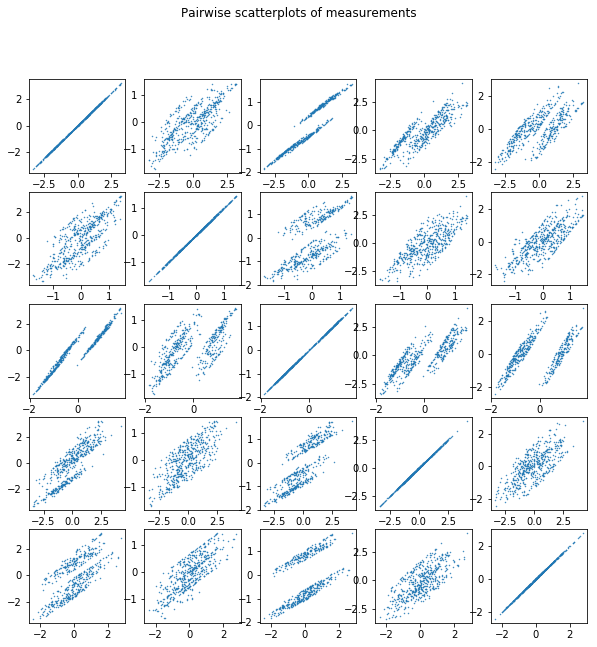

<Figure size 432x288 with 0 Axes>

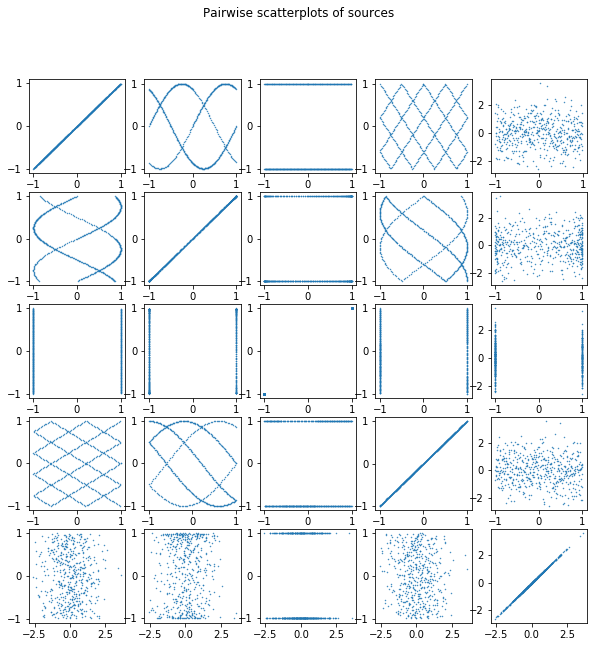

<Figure size 432x288 with 0 Axes>

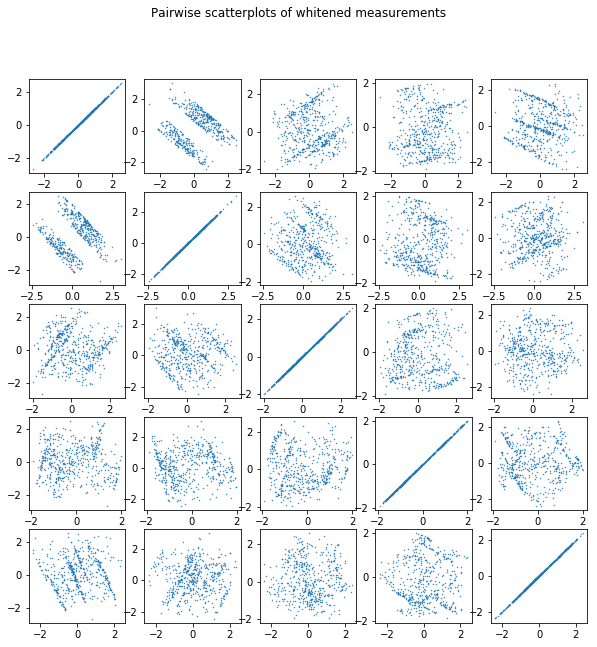

In [15]:
### 1.5 Interpret results of whitening
def plot_pairwise_scatters(data, suffix):
    """
    Makes scatter plots of all pairs of signals in given dataset.
    """
    plt.figure()
    fig, ax = plt.subplots(nrows = data.shape[0], ncols = data.shape[0])
    fig.set_figheight(10)
    fig.set_figwidth(10)

    for i, row in enumerate(ax):

        for j, col in enumerate(row):


            col.scatter(x = data[i, :], y = data[j, :], s = 0.2)
    
    plt.suptitle(f"Pairwise scatterplots of {suffix}")

    plt.show()
    
plot_pairwise_scatters(X, 'measurements')
plot_pairwise_scatters(S, 'sources')
plot_pairwise_scatters(Xw, 'whitened measurements')

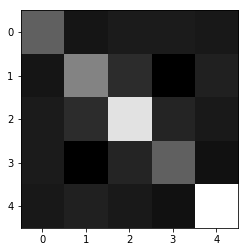

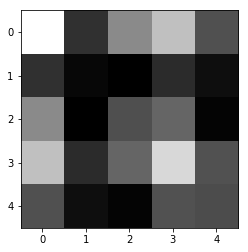

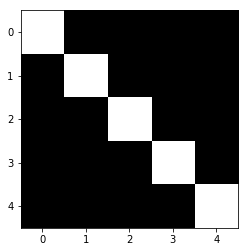

In [16]:
# Compute and visualize covarianve matrices
# Dummy covariance matrix C;
datasets = [S, X, Xw]

for data in datasets:
    plt.figure()
    C = np.cov(data)
    ax = imshow(C, cmap='gray', interpolation='nearest')

Are the signals independent after whitening?

The scatterplots of the whitened signals (i.e., the off-diagonal plots) show seemingly spuriously placed clouds of dots, which is what you'd expect from independent data. However, for some of the pairs of signals, e.g., the plots of the whitened measurements at indices (0,1) and (1,0), there is still a clear correlation structure to be seen. Whitening thus succeeds in making some of the signals approximately independent, but fails to do so for the pairs of signals that have too strong of a dependence to begin with. Furthermore, the covariance matrix is approximately equal to the identity matrix, so decorrelation has been achieved. However, one cannot directly assume independence based solely on decorrelation.

### 1.6 Covariance (5 points)
Explain what a covariant algorithm is. 

An algorithm that gives the same results independent of the units in which quantities are measured.

### 1.7 Independent Component Analysis (25 points)
Implement the covariant ICA algorithm as described in MacKay. Write a function `ICA(X, activation_function, learning_rate)`, that returns the demixing matrix $\mathbf{W}$. The input `activation_function` should accept a function such as `lambda a: -tanh(a)`. Update the gradient in batch mode, averaging the gradients over the whole dataset for each update. Make it efficient, so use matrix operations instead of loops where possible (loops are slow in interpreted languages such as python and matlab, whereas matrix operations are internally computed using fast C code). Experiment with the learning rate and the initialization of $\mathbf{W}$. Your algorithm should be able to converge (i.e. `np.linalg.norm(grad) < 1e-5`) in within 10000 steps.

In [17]:
### 1.7 Independent Component Analysis
def ICA(X, activation_function, learning_rate=0.1):
    
    converged = False
    
    # initialize mixing matrix W
    W = np.random.uniform(low = 0, high = 0.001, size = (X.shape[0], X.shape[0]))
    
    # full batch gradient updating
    steps = 10000
    for step in range(steps):
        # put X through a linear mapping
        A = np.dot(W, X)
        
        #Put A through a non-linear mapping using the activation function, to produce Z
        Z = activation_function(A)
        
        # Put A back through W to produce X'
        Xp = np.dot(W.T, A)
        
        # Update W
        grad = learning_rate * (W + np.dot(Z, Xp.T))
        W = W + grad
        
        if np.linalg.norm(grad) < 1e-5:
            converged = True
            print('Converged.')
            print(f"Number of steps: {step + 1}")
            break
            
    if not converged:
        print("Failed to converge.")
        
    return W

In [18]:
# Added by Lennert: Adapted testing cell with normal learning rate
# We will test your function so make sure it runs with only X and phi as input, and returns only W
# Also it should converge for all activation functions

W_estimates = [ICA(Xw, activation_function=phi, learning_rate=0.1) for phi in activation_functions]
assert all([W_est.shape == (num_sources, num_sources) for W_est in W_estimates])

Converged.
Number of steps: 89
Converged.
Number of steps: 540
Converged.
Number of steps: 484
Converged.
Number of steps: 80


In [19]:
# We will test your function so make sure it runs with only X and phi as input, and returns only W
# Also it should converge for all activation functions

W_estimates = [ICA(Xw, activation_function=phi, learning_rate=1.0) for phi in activation_functions]
assert all([W_est.shape == (num_sources, num_sources) for W_est in W_estimates])


Failed to converge.
Failed to converge.


/anaconda3/envs/ml2labs/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  


Failed to converge.
Failed to converge.


### 1.8 Experiments  (5 points)
Run ICA on the provided signals using each activation function $\phi_0, \ldots, \phi_3$ (or reuse `W_estimates`). Use the found demixing matrix $\mathbf{W}$ to reconstruct the signals and plot the retreived signals for each choice of activation function.

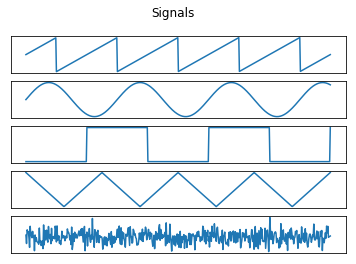

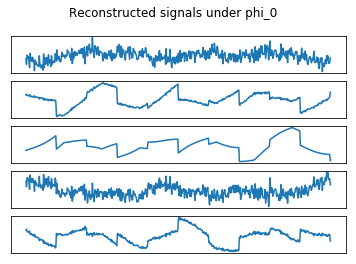

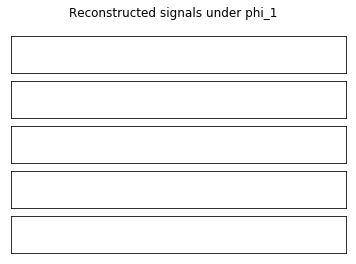

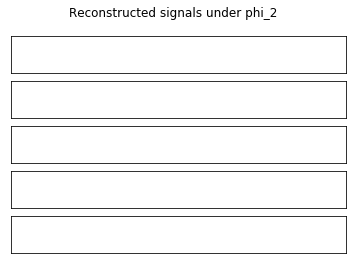

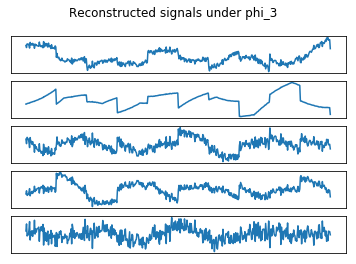

In [20]:
# 1.8 Experiments
plot_signals(S)
for i in range(len(activation_functions)):
    
    S_reconstructed = np.dot(W_estimates[i], Xw)
    
    plot_signals(S_reconstructed, title = f"Reconstructed signals under phi_{i}")


Does it make a difference (in terms of speed of convergence) if you whiten your data before running ICA?
    

In [21]:
W_estimates_unwhitened = [ICA(X, activation_function=phi, learning_rate=0.1) for phi in activation_functions]

Converged.
Number of steps: 115
Converged.
Number of steps: 712
Converged.
Number of steps: 727
Converged.
Number of steps: 118


Convergence appears slightly to notably slower for the non-whitened data. This could be attributed to the lower level of expressivity of non-whitened X's W-matrix, leading to less pronounced optima, and thereby slower convergence as the algorithm has more trouble finding such an optimum.

### 1.9 Audio demixing (10 points)
The 'cocktail party effect' refers to the ability humans have to attend to one speaker in a noisy room. We will now use ICA to solve a similar but somewhat idealized version of this problem. The code below loads 5 sound files and plots them.

Use a random non-singular mixing matrix to mix the 5 sound files. You can listen to the results in your browser using `play_signals`, or save them to disk if this does not work for you. Plot histograms of the mixed audio and use your ICA implementation to de-mix these and reproduce the original source signals. As in the previous exercise, try each of the activation functions.

Keep in mind that this problem is easier than the real cocktail party problem, because in real life there are often more sources than measurements (we have only two ears!), and the number of sources is unknown and variable. Also, mixing is not instantaneous in real life, because the sound from one source arrives at each ear at a different point in time. If you have time left, you can think of ways to deal with these issues.

In [22]:
import scipy.io.wavfile
from IPython.display import Audio, display, Markdown

# Save mixtures to disk, so you can listen to them in your audio player
def save_wav(data, out_file, rate):
    scaled = np.int16(data / np.max(np.abs(data)) * 32767)
    scipy.io.wavfile.write(out_file, rate, scaled)

# Or play them in your browser
def play_signals(S, sample_rate, title="Signals"):
    display(Markdown(title))
    for signal in S:
        display(Audio(signal, rate=sample_rate))

Signals

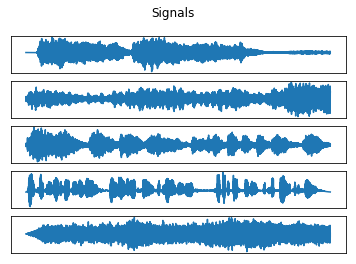

In [23]:
# Load audio sources
source_files = ['beet.wav', 'beet9.wav', 'beet92.wav', 'mike.wav', 'street.wav']
wav_data = []
sample_rate = None
for f in source_files:
    sr, data = scipy.io.wavfile.read(f, mmap=False)
    if sample_rate is None:
        sample_rate = sr
    else:
        assert(sample_rate == sr)
    wav_data.append(data[:190000])  # cut off the last part so that all signals have same length

# Create source and measurement data
S_audio = np.c_[wav_data]
plot_signals(S_audio)
play_signals(S_audio, sample_rate)

Converged.
Number of steps: 47
Converged.
Number of steps: 945
Converged.
Number of steps: 792
Converged.
Number of steps: 57


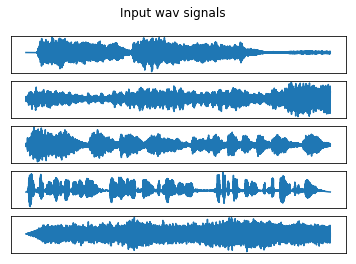

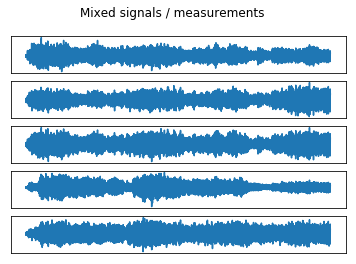

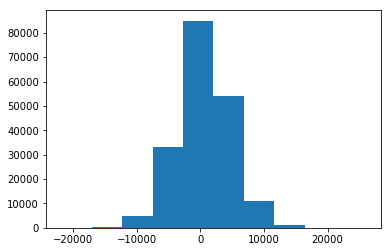

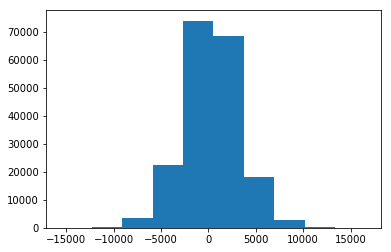

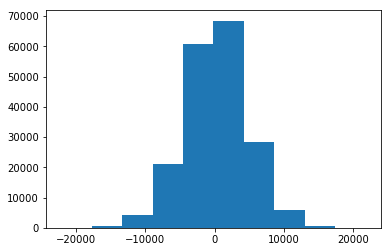

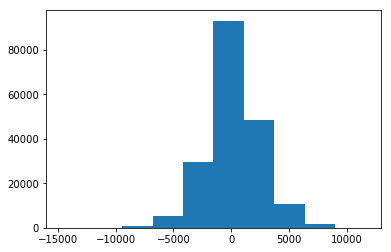

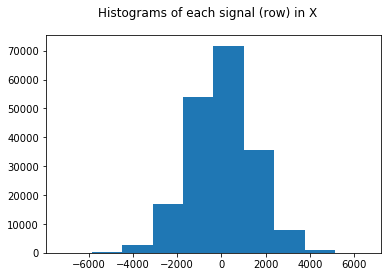

In [26]:
### 1.9 Audio demixing
# Plot wav signals
plot_signals(S_audio, title = 'Input wav signals')

# Create random non-singular mixing matrix
A_wav = random_nonsingular_matrix(d=S_audio.shape[0])

# Create mixed measurements
X_wav = make_mixtures(S_audio, A_wav)
plot_signals(X_wav, title = 'Mixed signals / measurements')

# Plot histograms of mixed audio signals
plot_histograms(X_wav)

# Whiten data
Xw_wav = whiten(X_wav)

#Use ICA to demix mixed signals
W_wav_estimates = [ICA(Xw_wav, activation_function=phi, learning_rate=0.1) for phi in activation_functions]


Activation function: 0


Signals

Activation function: 1


Signals

Activation function: 2


Signals

Activation function: 3


Signals

/anaconda3/envs/ml2labs/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


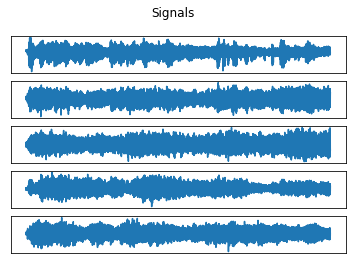

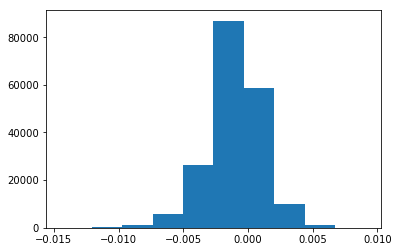

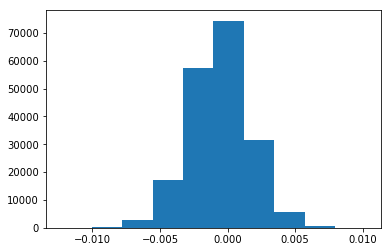

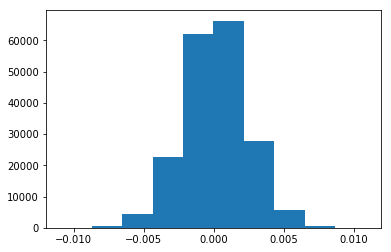

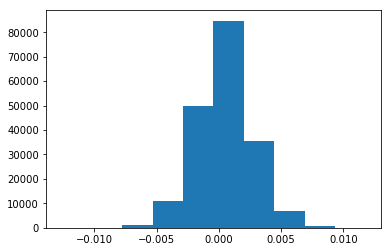

...

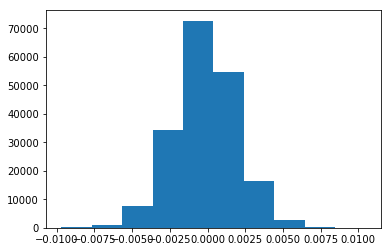

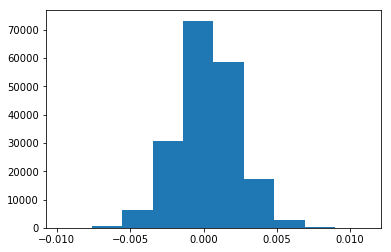

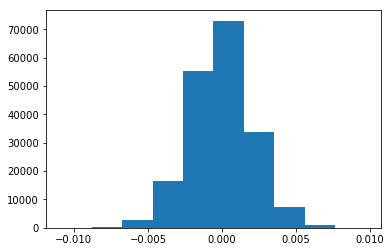

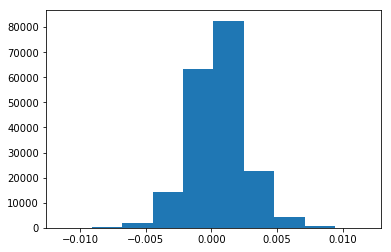

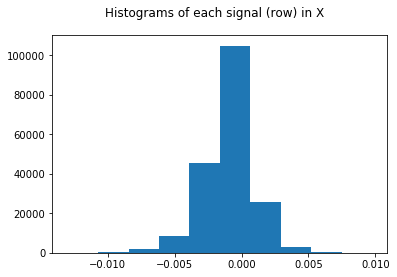

In [27]:
# Now demix the signals and plot/play the results
for i, W_wav_est in enumerate(W_wav_estimates):
    print(f"Activation function: {i}")
    S_demixed = np.dot(W_wav_est, Xw_wav)
    play_signals(S_demixed, sample_rate)
    plot_signals(S_demixed)
    plot_histograms(S_demixed)

Report your results. Using which activation functions ICA recovers the sources?

Activation functions 0 and 3 are the only ones that manage to reconstruct a few signals without remnants of the person's voice. Overall, activation function 0 (i.e., $\phi_0(a) = -\tanh(a)$) outperforms the rest, with the best isolations of separate signals (although there is still quite some background noise to be heard in some of the demixed signals of $\phi_0$.

### 1.10 Excess Kurtosis (15 points)
The (excess) kurtosis is a measure of 'peakedness' of a distribution. It is defined as
$$
\verb+Kurt+[X] = \frac{\mu_4}{\sigma^4} - 3 = \frac{\operatorname{E}[(X-{\mu})^4]}{(\operatorname{E}[(X-{\mu})^2])^2} - 3
$$
Here, $\mu_4$ is known as the fourth moment about the mean, and $\sigma$ is the standard deviation.
The '-3' term is introduced so that a Gaussian random variable has 0 excess kurtosis.
We will now try to understand the performance of the various activation functions by considering the kurtosis of the corresponding priors, and comparing those to the empirical kurtosis of our data.

#### 1.10.1 (10 points)
First, compute analytically the kurtosis of the four priors that you derived from the activation functions before. You may find it helpful to use an online service such as [Wolfram Alpha](https://www.wolframalpha.com/) or [Integral Calculator](https://www.integral-calculator.com/) to (help you) evaluate the required integrals. Give your answer as both an exact expression as well as a numerical approximation (for example $\frac{\pi}{2} \approx 1.571$).

To simplify the following formulas, I use that $\mu = 0$ for all the priors, and use $\int$ to denote $\int_{-\infty}^{\infty}$, so for every prior I evaluate $\frac{\mathbb{E}_{a \sim p_i(a)}[a^4]}{(\mathbb{E}_{a \sim p_i(a)}[a^2])^2}$ for $i = 0, 1, 2, 3$.

$
\text{Kurt}_{a \sim p_0(a)}[a] = \frac{\int \frac{a^4}{\cosh(a)} da}{(\int \frac{a^2}{\cosh(a)}da)^2} - 3 = \frac{\frac{5\pi^5}{16}}{(\frac{\pi^3}{4})^2} = \frac{5 - 3\pi}{\pi} \approx -1.408
$

$
\text{Kurt}_{a \sim p_1(a)}[a] = \frac{\int \exp[-\frac{1}{2}a^2]\cosh(a) a^4 da}{(\int \exp[-\frac{1}{2}a^2]\cosh(a) a^2 da)^2} - 3 = \frac{10 \sqrt{2e\pi}}{(2\sqrt{2e\pi})^2} - 3 = \frac{5}{2\sqrt{2e\pi}} -3 \approx -2.395
$

$
\text{Kurt}_{a \sim p_2(a)}[a] = \frac{\int \exp[-\frac{1}{4}a^4]a^4 da}{(\int \exp[-\frac{1}{4}a^4]a^2 da)^2} - 3 = 
\frac{\frac{\Gamma(\frac{1}{4})}{\sqrt{2}}}{(\sqrt{2}\Gamma(\frac{3}{4}))^2} - 3 \approx -2.146
$

$
\text{Kurt}_{a \sim p_3(a)}[a] = \frac{\int (a^2 + 5)^{-3} a^4}{(\int (a^2 + 5)^{-3} a^2 da)^2} - 3 = 
\frac{\frac{3\pi}{8\sqrt{5}}}{(\frac{\pi}{40\sqrt{5}})^2} - 3 = \frac{600\sqrt{5}}{\pi} - 3\approx 424.058 
$

In [28]:
### Include your answer here (you can use math.gamma if needed)
def get_kurtosis():
    # Return a list with 4 numbers / expressions
    # return [0, 0, 0, 0]
    
    k_0 = (5 - 3 * math.pi) / math.pi
    k_1 = 5 / (2 * math.sqrt(2 * math.exp(1) * math.pi)) - 3
    k_2 = (math.gamma(0.25) / math.sqrt(2)) / ((math.sqrt(2) * math.gamma(0.75))**2) - 3
    k_3 = 600*math.sqrt(5) / math.pi - 3
    
    return [k_0, k_1, k_2, k_3]
    

In [29]:
# Let's check
kurtosis = get_kurtosis()
print (kurtosis)
assert len(kurtosis) == 4


[-1.4084505690810465, -2.3950731887021415, -2.146372317311526, 424.0575260503063]


#### 1.10.2 (5 points)
Now use the `scipy.stats.kurtosis` function, with the `fisher` option set to `True`, to compute the empirical kurtosis of the dummy signals and the real audio signals.

Can you use this data to explain the performance of the various activation functions on the synthetic and real data?

In [30]:
### 1.10.2 Excess Kurtosis
from scipy.stats import kurtosis as kurt
print(60 * "=")
for i, signal in enumerate(S):
    print(f"|| Dummy signal: {i} || Empircal kurtosis: {kurt(signal, fisher = True)}")

print(60 * "=")    
    
for i, signal in enumerate(S_audio):
    print(f"|| Audio signal: {i} || Empircal kurtosis: {kurt(signal, fisher = True)}")
print(60 * "=")

|| Dummy signal: 0 || Empircal kurtosis: -1.1964024434410994
|| Dummy signal: 1 || Empircal kurtosis: -1.482871132439309
|| Dummy signal: 2 || Empircal kurtosis: -1.8401970082696886
|| Dummy signal: 3 || Empircal kurtosis: -1.2000384006144096
|| Dummy signal: 4 || Empircal kurtosis: -0.060702905278198216
|| Audio signal: 0 || Empircal kurtosis: 1.7943151667734192
|| Audio signal: 1 || Empircal kurtosis: 2.0688506407485283
|| Audio signal: 2 || Empircal kurtosis: 1.936092953713005
|| Audio signal: 3 || Empircal kurtosis: 5.051917206465037
|| Audio signal: 4 || Empircal kurtosis: 0.5388758081585339


For the audio signals, the kurtosis of activation function 0 appears to resemble that of the sounds the best on average. Albeit that those of function 1 and 2 are also not far off. This could explain the similar performances of the various functions, but the best performance of $\phi_0$.

A similar line of reasoning holds for the dummy signals.